# Azure Computer Vision 4 (Florence)
## Fashion visual search demo with Azure Computer Vision 4 Florence

<img src="img/header.png" width=360>
<br>
<i>Note: this image was generated with Azure Open AI Dall-e 2</i>

### Visual search with vector embeddings
**Vector embeddings** are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

<img src="img/multi_modal.jpg" width=640>

### Business applications
- **Digital asset management**: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- **Medical image retrieval**: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- **Security and surveillance**: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- **Forensic image retrieval**: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- **E-commerce**: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- **Fashion and design**: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

### Visual Search Process
<img src="img/process.png" width=480>

### Image Retrieval with Azure Computer Vision Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/how-to/image-retrieval

### Demo images
The images used in this demo are available here: 
https://bss-gn103.seismic.com/api/download/v1/blob?t=microsoft&c=microsoft-collaboration&id=090646ac-e0f3-433e-afeb-798bc2043a27&et=20230406092024&fn=fashion.ZIP&sig=dAHPKYNSEy2YwSUYMXpqOtgNHhM2tqyCbmQLy0CV8%2BQ%3D
<br>

They are a sample of this collection of images: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data
<br><br>
> Serge Retkowsky | Microsoft | https://github.com/retkowsky | 18th of April, 2023

## Table of contents

1. [Librairies](#chapt1)

2. [Informations](#chapt2)

3. [Our products images](#chapt3)

4. [Vectors embedding generation for all the catalog images](#chapt4)

5. [Visual search using a field image](#chapt5)

6. [Visual search using some text](#chapt6)

## 1. <a name="chapt1"></a> Librairies

In [1]:
import datetime
import glob
import json
import os
import random
import sys
import time

from dotenv import load_dotenv
from PIL import Image

In [2]:
# Getting Azure CV endpoint and key from the azure.env file

load_dotenv("visualsearch.env")
key = os.getenv('azure_cv_key')
endpoint = os.getenv("azure_cv_endpoint")

### Importing our specific functions

In [3]:
pyfile = "visualsearch.py"

print("Python file:", pyfile,
      "Date:", time.ctime(os.path.getmtime(pyfile)))

Python file: visualsearch.py Date: Tue Apr 18 09:10:01 2023


In [4]:
from visualsearch import (describe_image_with_AzureCV4,
                          get_image_from_url,
                          get_results_using_image,
                          get_results_using_prompt,
                          remove_background,
                          side_by_side_images,
                          view_image,
                          )

## 2. <a name="chapt2"></a> Informations

In [5]:
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

In [6]:
print("Today is", datetime.datetime.today())

Today is 2023-04-18 15:37:17.280582


## 3. <a name="chapt3"></a> Our products images

In [7]:
IMAGES_DIR = "fashion"

In [8]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: fashion
Total number of catalog images = 10,226


### Some images

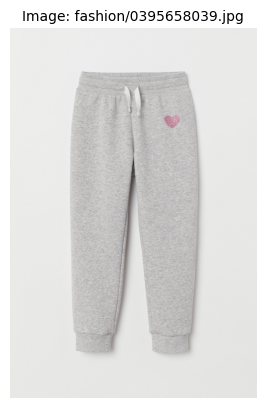

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a pair of grey sweatpants with a heart on the side = 0.457

   Detected tags:
    clothing           = 0.998
    trouser            = 0.893
    person             = 0.692


In [9]:
idx = 100

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

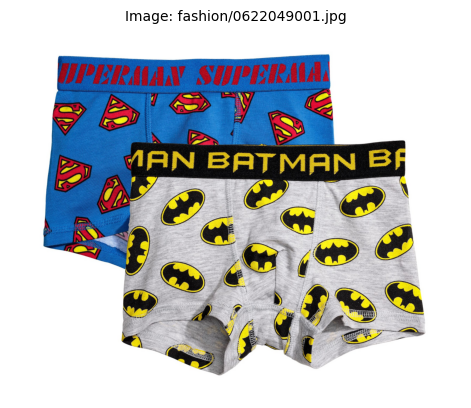

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a pair of blue and grey boxer briefs with yellow and red superheroes = 0.360

   Detected tags:
    clothing           = 0.989
    underpants         = 0.956
    text               = 0.887
    shorts             = 0.852


In [10]:
idx = 1000

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

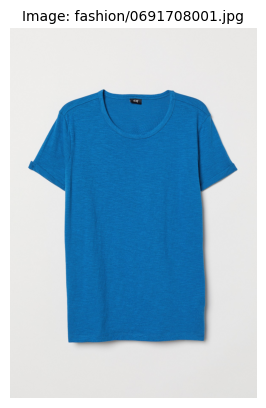

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a blue shirt on a white background = 0.586

   Detected tags:
    clothing           = 0.998
    active shirt       = 0.958
    top                = 0.914
    casual dress       = 0.884
    sleeve             = 0.874
    t-shirt            = 0.867
    shirt              = 0.848
    blue               = 0.676


In [11]:
idx = int(random.uniform(0, len(image_files)))

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

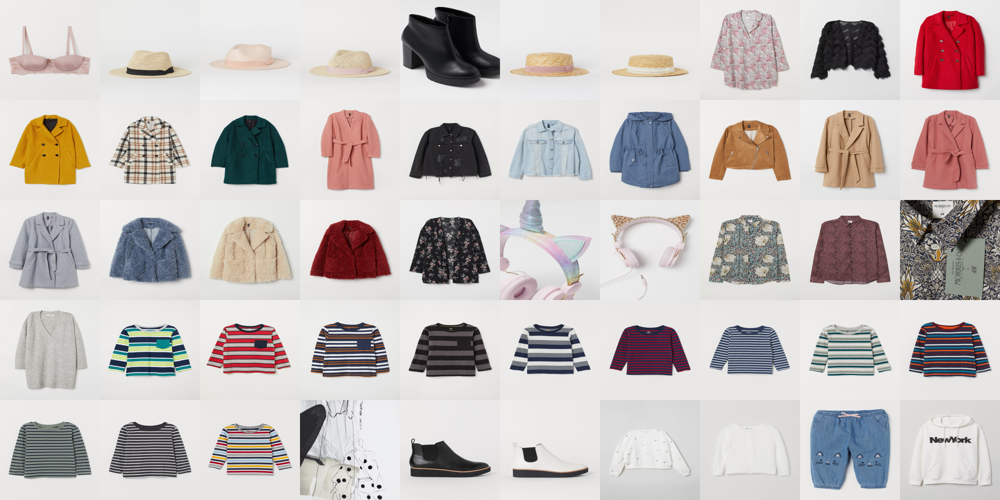

In [12]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 10000
samples = image_files[start:start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    'RGB', (num_images_per_row * img_size, num_images_per_col * img_size))

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 4. <a name="chapt4"></a> Loading vector embeddings

In [13]:
JSON_DIR = "json"

glob.glob(JSON_DIR + "/*.json")

['json/img_embed_18Apr2023_153558.json']

In [14]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [(f, os.path.getmtime(
    os.path.join(JSON_DIR, f))) for f in jsonfiles]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + '/' + modification_times[0][0]

# Loading the most recent file
print(
    f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_18Apr2023_153558.json

Done: number of imported vector embeddings = 10,226


## 5. <a name="chapt5"></a> Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). The search will be made using the image without its background.


In [15]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 10,226


In [16]:
TEST_DIR = "test"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 6


### Test 1

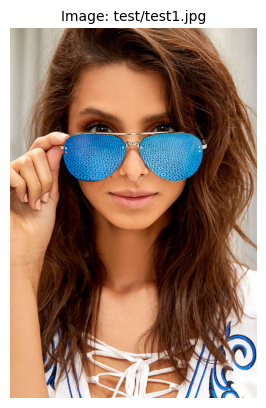

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a woman wearing blue sunglasses = 0.500

   Detected tags:
    human face         = 0.990
    person             = 0.988
    fashion accessory  = 0.947
    goggles            = 0.931
    long hair          = 0.930
    clothing           = 0.924
    lipstick           = 0.915
    lip                = 0.911
    eyewear            = 0.894
    cool               = 0.868
    photo shoot        = 0.868
    cosmetics          = 0.866
    woman              = 0.864
    fashion            = 0.857
    lip gloss          = 0.856
    throat             = 0.847
    eyelash            = 0.843
    lady               = 0.842
    model              = 0.841
    girl               = 0.671
    hair               = 0.664
    wearing            = 0.645
    sunglasses         = 0.571


In [17]:
reference_image = test_images[0]

view_image(reference_image)
describe_image_with_AzureCV4(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


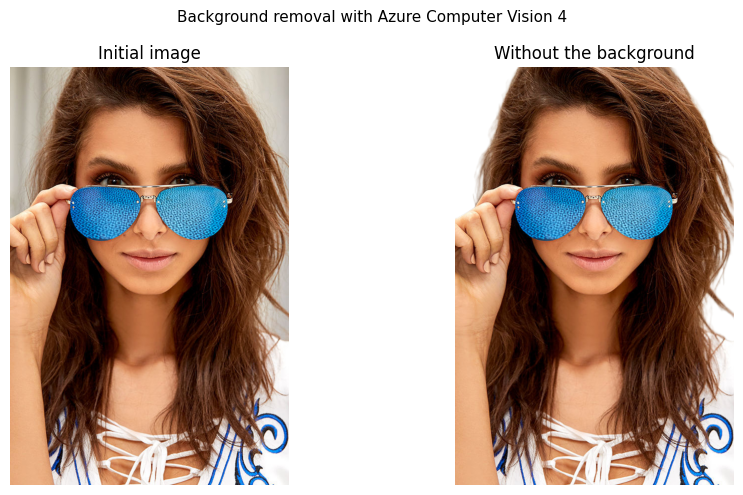

In [18]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0699325004.jpg with similarity index = 0.6824942292354449
002 fashion/0694669002.jpg with similarity index = 0.6720143237707368
003 fashion/0625146001.jpg with similarity index = 0.6607062769938147
004 fashion/0694748001.jpg with similarity index = 0.6548463093671929
005 fashion/0647236001.jpg with similarity index = 0.6515243234654139
006 fashion/0398947002.jpg with similarity index = 0.6487319560469152


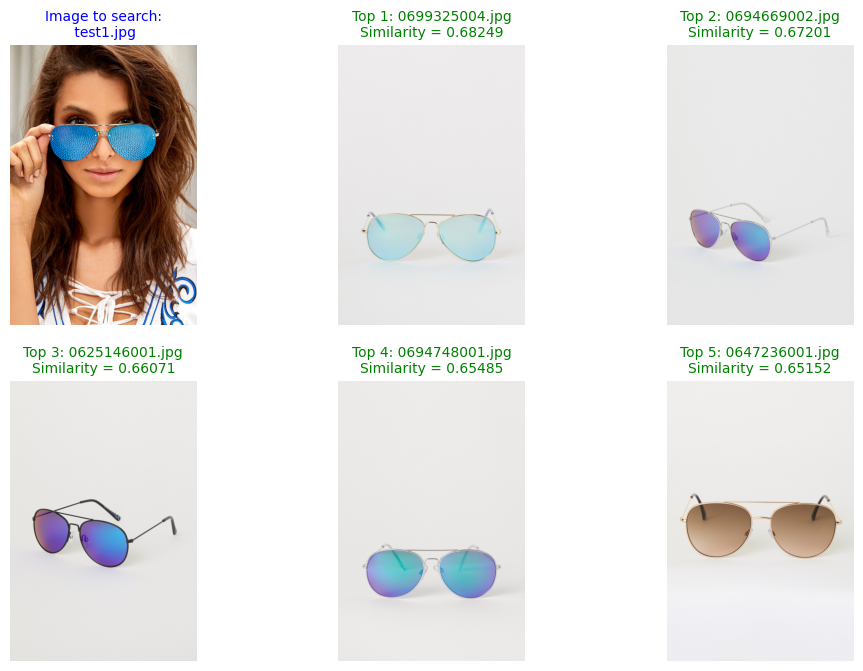

 2023-04-18 15:37:46 Powered by Azure Computer Vision Florence


,image_file,similarity
9888,fashion/0699325004.jpg,0.682494
7698,fashion/0694669002.jpg,0.672014
2195,fashion/0625146001.jpg,0.660706
7793,fashion/0694748001.jpg,0.654846
5321,fashion/0647236001.jpg,0.651524
...,...,...
2981,fashion/0627019003.jpg,0.214294
6384,fashion/0690955002.jpg,0.208169
3639,fashion/0640001004.jpg,0.205036
3642,fashion/0640001018.jpg,0.203654


In [19]:
get_results_using_image(reference_image, nobackground_image,
                        image_files, list_emb, topn=6, disp=True)

### Test 2

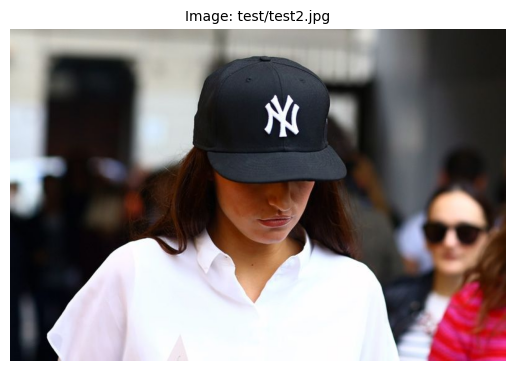

In [20]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


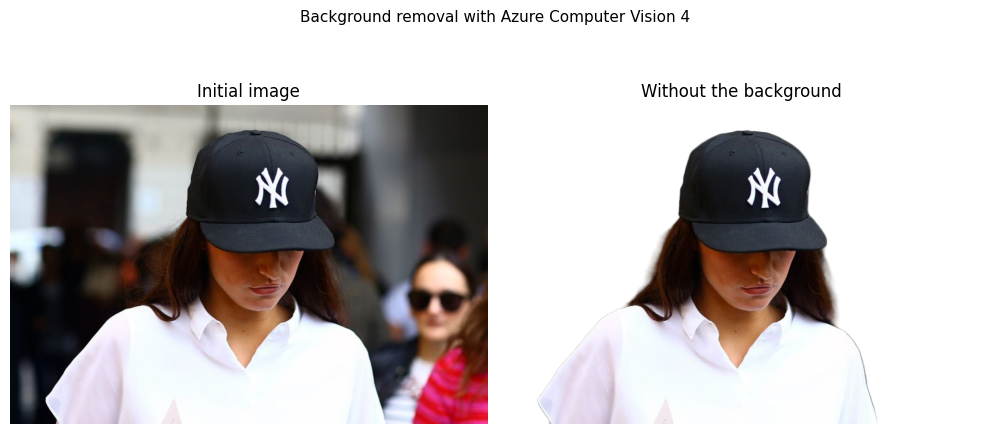

In [21]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0625068002.jpg with similarity index = 0.5807947191963214
002 fashion/0694739001.jpg with similarity index = 0.5434852130967669
003 fashion/0694739028.jpg with similarity index = 0.5346296239749387
004 fashion/0694659018.jpg with similarity index = 0.5300253392128338
005 fashion/0694659051.jpg with similarity index = 0.5236966207780862
006 fashion/0694739062.jpg with similarity index = 0.5049902133047751


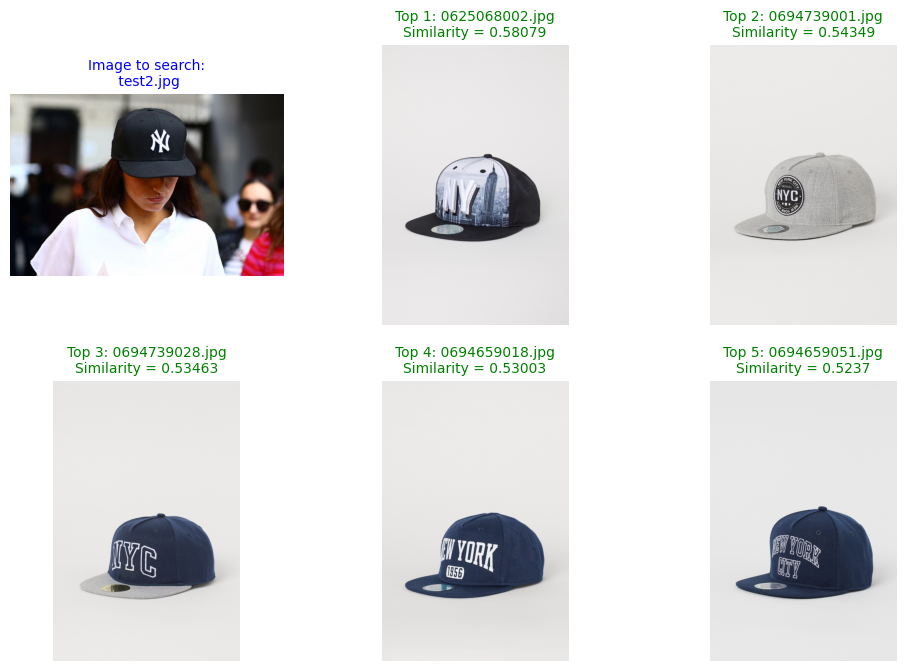

 2023-04-18 15:37:54 Powered by Azure Computer Vision Florence


,image_file,similarity
2137,fashion/0625068002.jpg,0.580795
7755,fashion/0694739001.jpg,0.543485
7769,fashion/0694739028.jpg,0.534630
7670,fashion/0694659018.jpg,0.530025
7682,fashion/0694659051.jpg,0.523697
...,...,...
3563,fashion/0629681003.jpg,0.157689
5166,fashion/0646735001.jpg,0.144486
8519,fashion/0696415001.jpg,0.139628
4474,fashion/0643162001.jpg,0.139440


In [22]:
get_results_using_image(reference_image, nobackground_image,
                        image_files, list_emb, topn=6, disp=True)

### Test 3

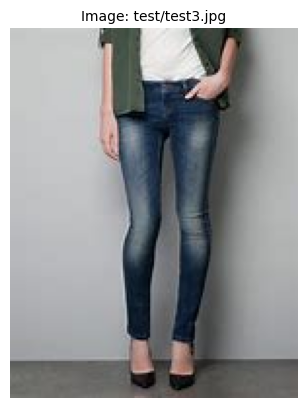

In [23]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


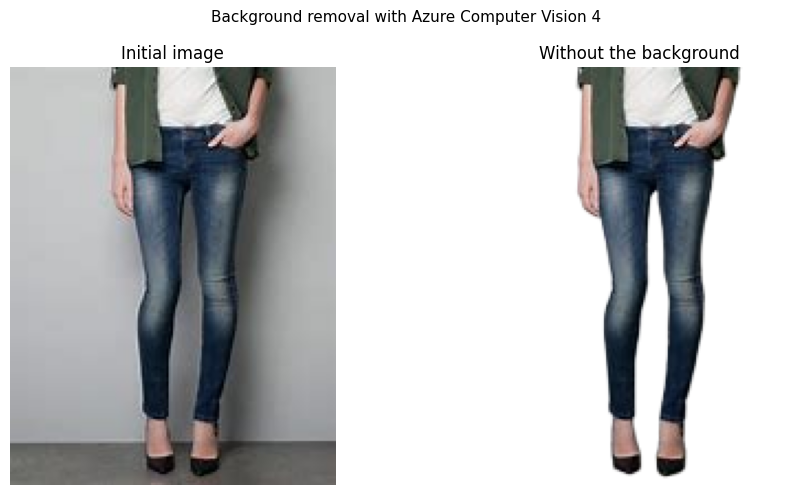

In [24]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0623720002.jpg with similarity index = 0.7340342365648683
002 fashion/0624251001.jpg with similarity index = 0.7319284039562948
003 fashion/0399201024.jpg with similarity index = 0.7243843518652915
004 fashion/0399087014.jpg with similarity index = 0.7219208482179384
005 fashion/0624257003.jpg with similarity index = 0.718839401863066
006 fashion/0698385002.jpg with similarity index = 0.7176968550104516


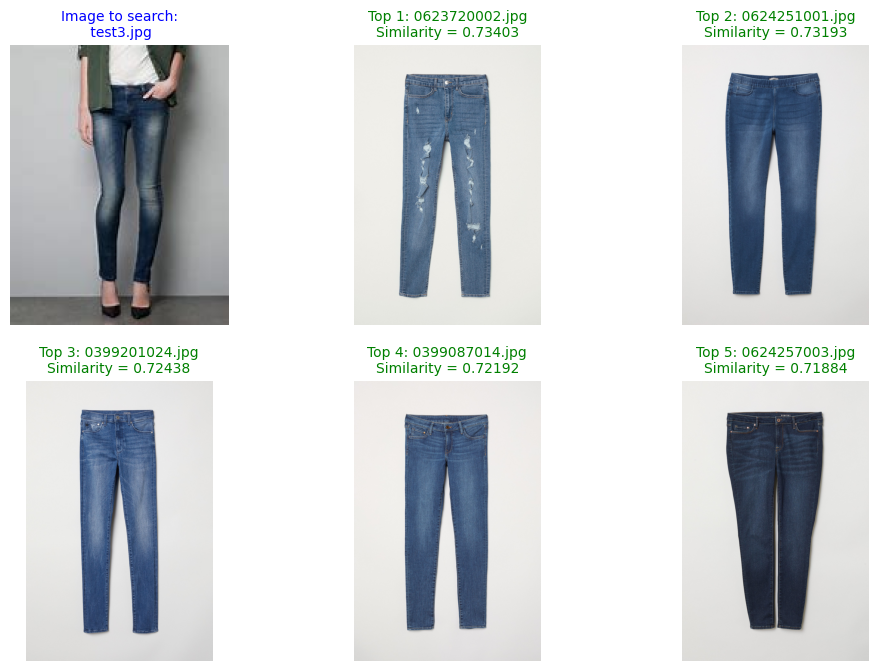

 2023-04-18 15:38:01 Powered by Azure Computer Vision Florence


,image_file,similarity
1475,fashion/0623720002.jpg,0.734034
1740,fashion/0624251001.jpg,0.731928
238,fashion/0399201024.jpg,0.724384
205,fashion/0399087014.jpg,0.721921
1751,fashion/0624257003.jpg,0.718839
...,...,...
4567,fashion/0643566001.jpg,0.260554
476,fashion/0620320001.jpg,0.257306
4767,fashion/0644649001.jpg,0.250245
4869,fashion/0645325001.jpg,0.246271


In [25]:
get_results_using_image(reference_image, nobackground_image,
                        image_files, list_emb, topn=6, disp=True)

### Test 4

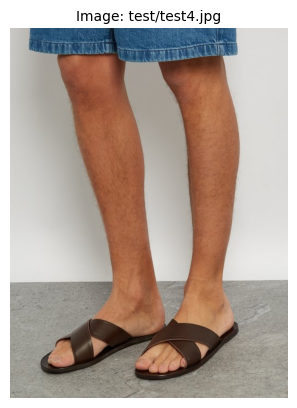

In [26]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


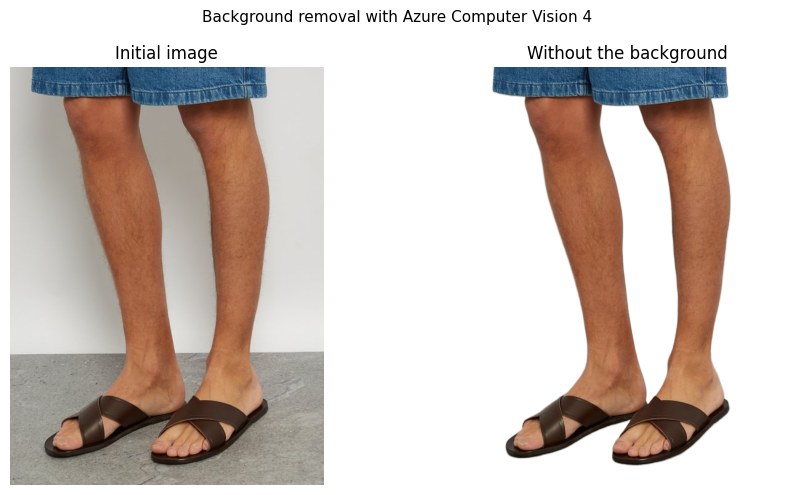

In [27]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0640989002.jpg with similarity index = 0.7327624579954947
002 fashion/0640989004.jpg with similarity index = 0.7080471097430465
003 fashion/0640989001.jpg with similarity index = 0.7076144017743466
004 fashion/0623935002.jpg with similarity index = 0.7051483337352286
005 fashion/0621780004.jpg with similarity index = 0.6970795552330734
006 fashion/0621915002.jpg with similarity index = 0.6967198402964826


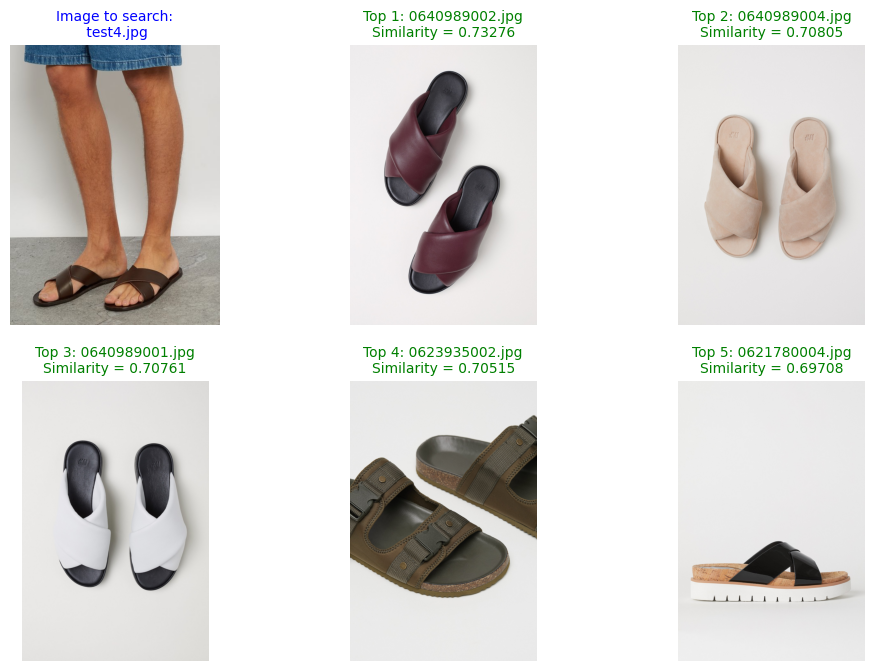

 2023-04-18 15:38:10 Powered by Azure Computer Vision Florence


,image_file,similarity
4024,fashion/0640989002.jpg,0.732762
4026,fashion/0640989004.jpg,0.708047
4023,fashion/0640989001.jpg,0.707614
1593,fashion/0623935002.jpg,0.705148
921,fashion/0621780004.jpg,0.697080
...,...,...
635,fashion/0620794005.jpg,0.212954
4568,fashion/0643574001.jpg,0.197510
4767,fashion/0644649001.jpg,0.165966
8519,fashion/0696415001.jpg,0.159389


In [28]:
get_results_using_image(reference_image, nobackground_image,
                        image_files, list_emb, topn=6, disp=True)

### Test 5

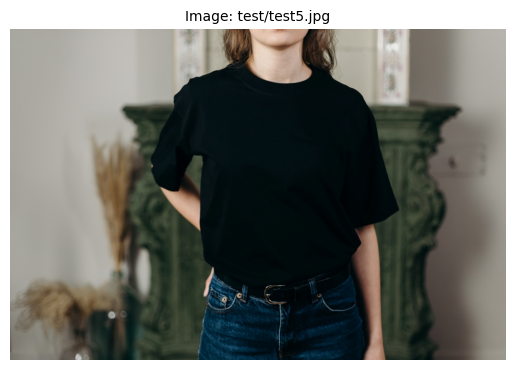

In [29]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


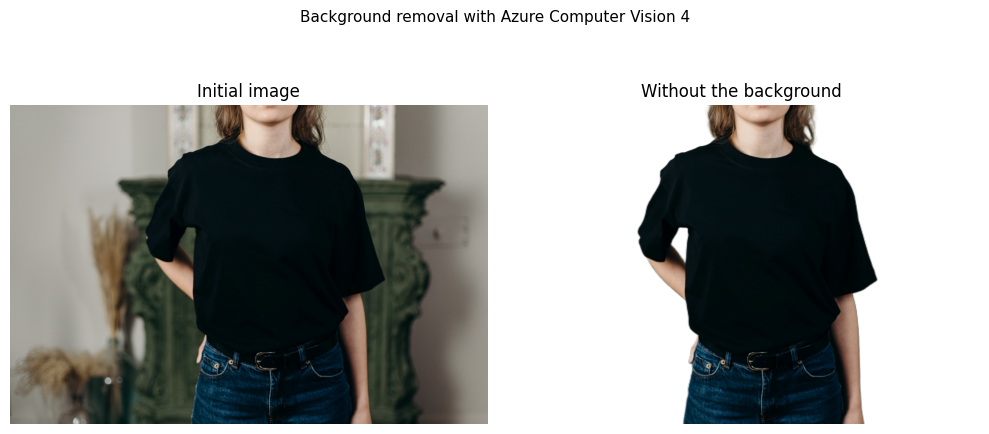

In [30]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 2 images:

001 fashion/0641427002.jpg with similarity index = 0.7047602245621297
002 fashion/0620316002.jpg with similarity index = 0.7010636458526878


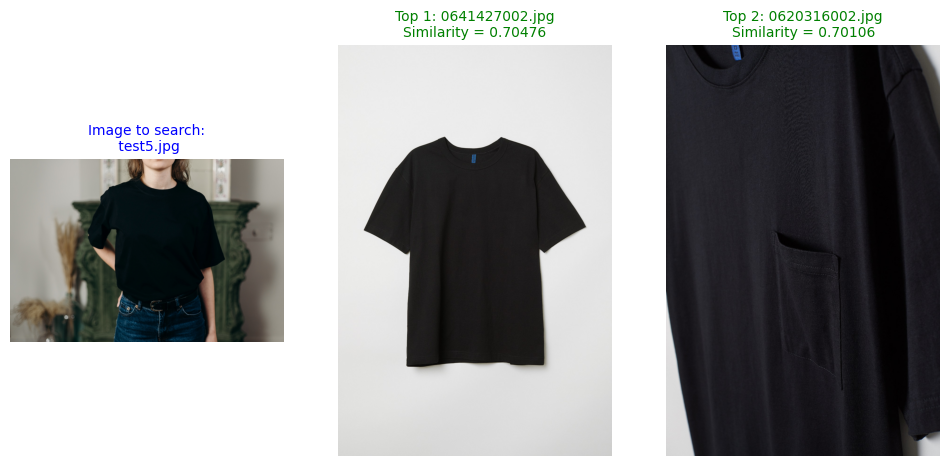

 2023-04-18 15:38:18 Powered by Azure Computer Vision Florence


,image_file,similarity
4131,fashion/0641427002.jpg,0.704760
471,fashion/0620316002.jpg,0.701064
4130,fashion/0641427001.jpg,0.697926
2538,fashion/0625939003.jpg,0.687902
6447,fashion/0690992001.jpg,0.678925
...,...,...
325,fashion/0620158001.jpg,0.235411
4568,fashion/0643574001.jpg,0.225102
4474,fashion/0643162001.jpg,0.221425
4767,fashion/0644649001.jpg,0.200473


In [31]:
get_results_using_image(reference_image, nobackground_image,
                        image_files, list_emb, topn=2, disp=True)

### Test 6

In [32]:
# We can download an image from an url
image_URL = "https://github.com/retkowsky/images/blob/master/fashion_image.jpg?raw=true"
reference_image = "download.jpg"

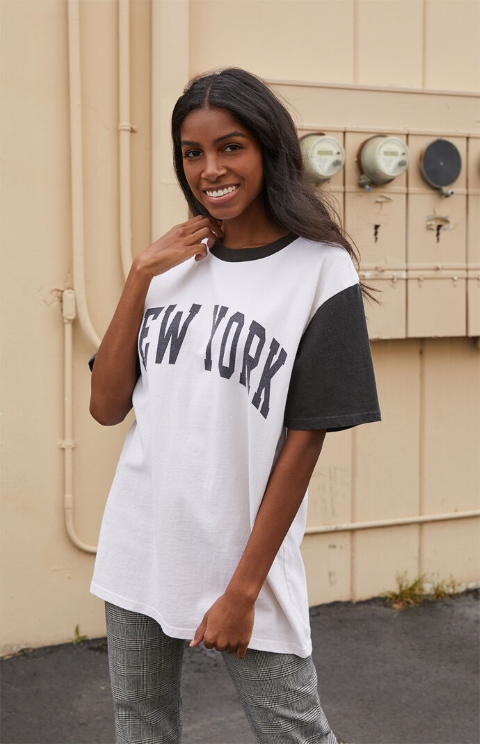

In [33]:
image = get_image_from_url(image_URL)
image

Removing background from the image using Azure Computer Vision 4.0...
Done


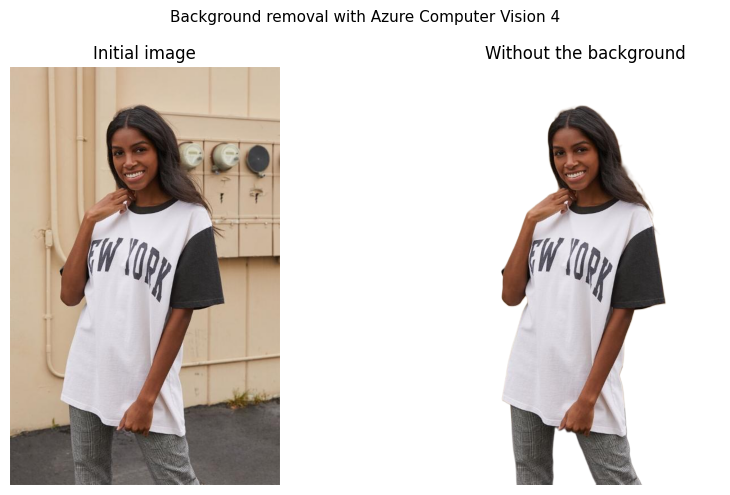

In [34]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0621522018.jpg with similarity index = 0.7686904827054383
002 fashion/0699923102.jpg with similarity index = 0.7531169888307501
003 fashion/0694131008.jpg with similarity index = 0.7436146849772344
004 fashion/0699923067.jpg with similarity index = 0.7426660076974677
005 fashion/0699923001.jpg with similarity index = 0.7134356893908417
006 fashion/0648703010.jpg with similarity index = 0.7072159439708652


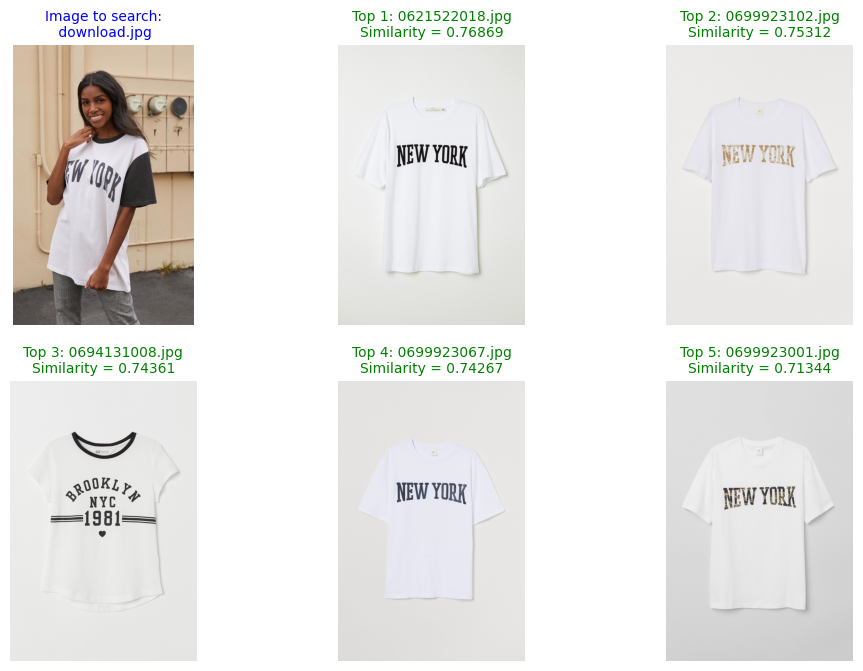

 2023-04-18 15:38:27 Powered by Azure Computer Vision Florence


,image_file,similarity
818,fashion/0621522018.jpg,0.768690
10174,fashion/0699923102.jpg,0.753117
7424,fashion/0694131008.jpg,0.743615
10163,fashion/0699923067.jpg,0.742666
10140,fashion/0699923001.jpg,0.713436
...,...,...
4767,fashion/0644649001.jpg,0.247456
4720,fashion/0644342001.jpg,0.238444
4212,fashion/0641822002.jpg,0.223638
4218,fashion/0641845001.jpg,0.218655


In [35]:
get_results_using_image(reference_image, nobackground_image,
                        image_files, list_emb, topn=6, disp=True)

### Test 7

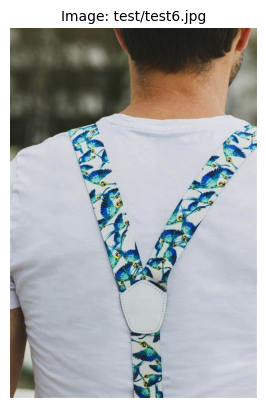

In [36]:
reference_image = test_images[5]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


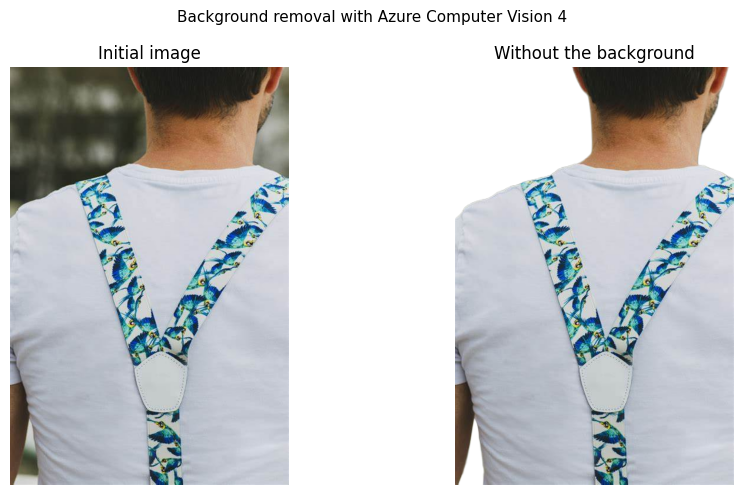

In [37]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 3 images:

001 fashion/0642775001.jpg with similarity index = 0.659289252152311
002 fashion/0694729001.jpg with similarity index = 0.6149495929867751
003 fashion/0694677001.jpg with similarity index = 0.6099858323582545


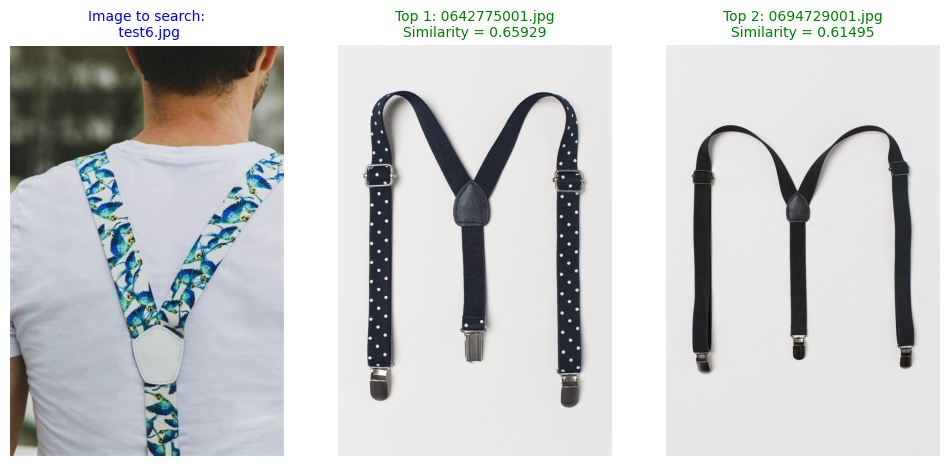

 2023-04-18 15:38:34 Powered by Azure Computer Vision Florence


,image_file,similarity
4385,fashion/0642775001.jpg,0.659289
7745,fashion/0694729001.jpg,0.614950
7710,fashion/0694677001.jpg,0.609986
4181,fashion/0641704005.jpg,0.585342
2023,fashion/0624692001.jpg,0.578024
...,...,...
4768,fashion/0644650001.jpg,0.233864
5577,fashion/0648414005.jpg,0.226933
5610,fashion/0648486001.jpg,0.225698
4767,fashion/0644649001.jpg,0.218187


In [38]:
get_results_using_image(reference_image, nobackground_image,
                        image_files, list_emb, topn=3, disp=True)

## 6. <a name="chapt6"></a> Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [39]:
query = "shirt with blue stripped lines on it"


Similar images using query = shirt with blue stripped lines on it


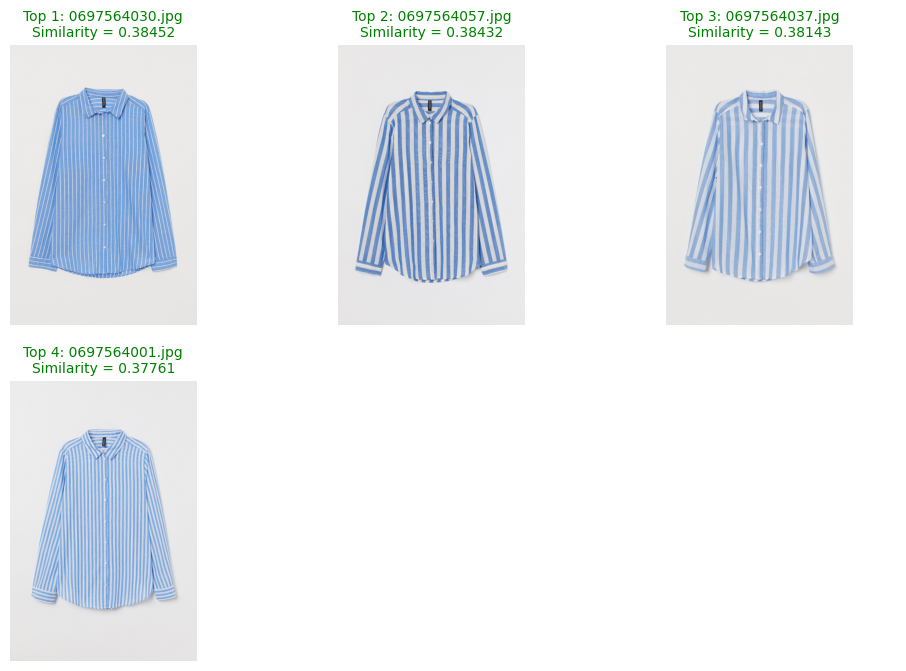

 2023-04-18 15:38:39 Powered by Azure Computer Vision Florence


,image_file,similarity
9119,fashion/0697564030.jpg,0.384519
9129,fashion/0697564057.jpg,0.384318
9123,fashion/0697564037.jpg,0.381431
9106,fashion/0697564001.jpg,0.377612
3392,fashion/0628920004.jpg,0.377208
...,...,...
5772,fashion/0649041001.jpg,0.053887
6852,fashion/0692705001.jpg,0.053451
9806,fashion/0699176001.jpg,0.049215
5352,fashion/0647376001.jpg,0.041492


In [40]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 2

In [41]:
query = "torn blue jeans"


Similar images using query = torn blue jeans


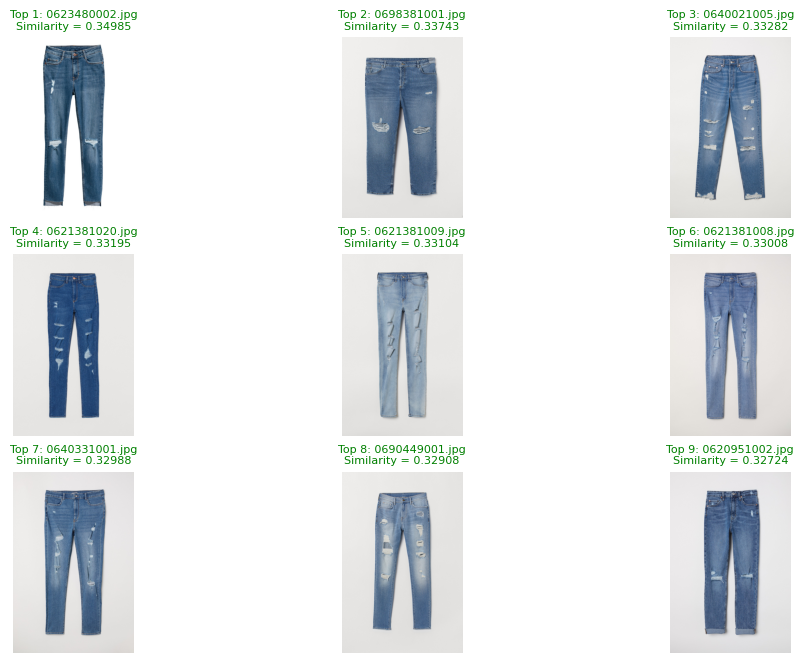

 2023-04-18 15:38:44 Powered by Azure Computer Vision Florence


,image_file,similarity
1439,fashion/0623480002.jpg,0.349852
9447,fashion/0698381001.jpg,0.337432
3653,fashion/0640021005.jpg,0.332817
769,fashion/0621381020.jpg,0.331948
762,fashion/0621381009.jpg,0.331042
...,...,...
6801,fashion/0692322002.jpg,0.055039
8610,fashion/0696628001.jpg,0.055026
2320,fashion/0625472001.jpg,0.054410
5384,fashion/0647465001.jpg,0.054247


In [42]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 3

In [43]:
query = "red dress with long sleeves"


Similar images using query = red dress with long sleeves


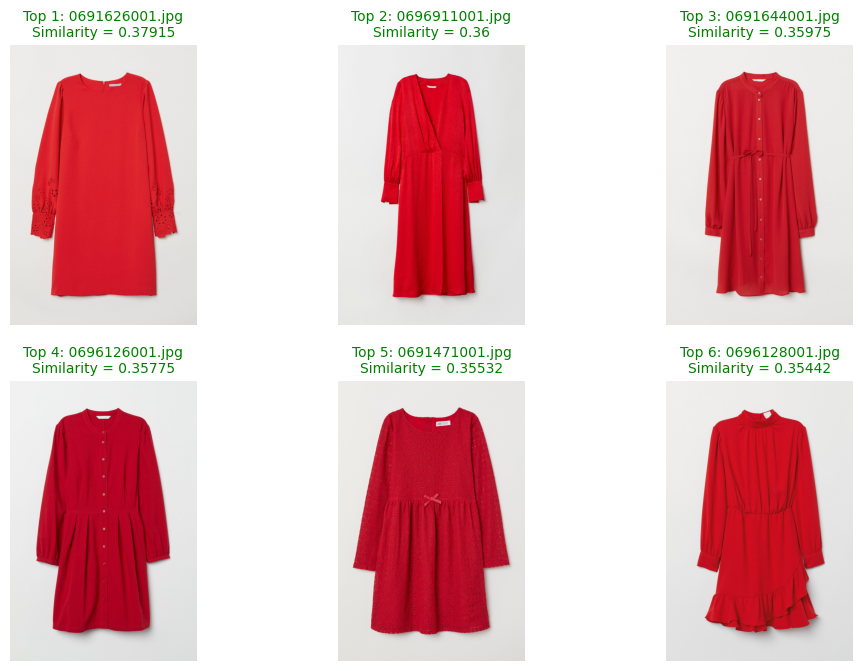

 2023-04-18 15:38:49 Powered by Azure Computer Vision Florence


,image_file,similarity
6590,fashion/0691626001.jpg,0.379149
8722,fashion/0696911001.jpg,0.359999
6592,fashion/0691644001.jpg,0.359745
8407,fashion/0696126001.jpg,0.357748
6544,fashion/0691471001.jpg,0.355320
...,...,...
2372,fashion/0625565001.jpg,0.023276
4466,fashion/0643160003.jpg,0.022142
9723,fashion/0699011001.jpg,0.022124
130,fashion/0395864070.jpg,0.019949


In [44]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 4

In [45]:
query = "rainbow dress"


Similar images using query = rainbow dress


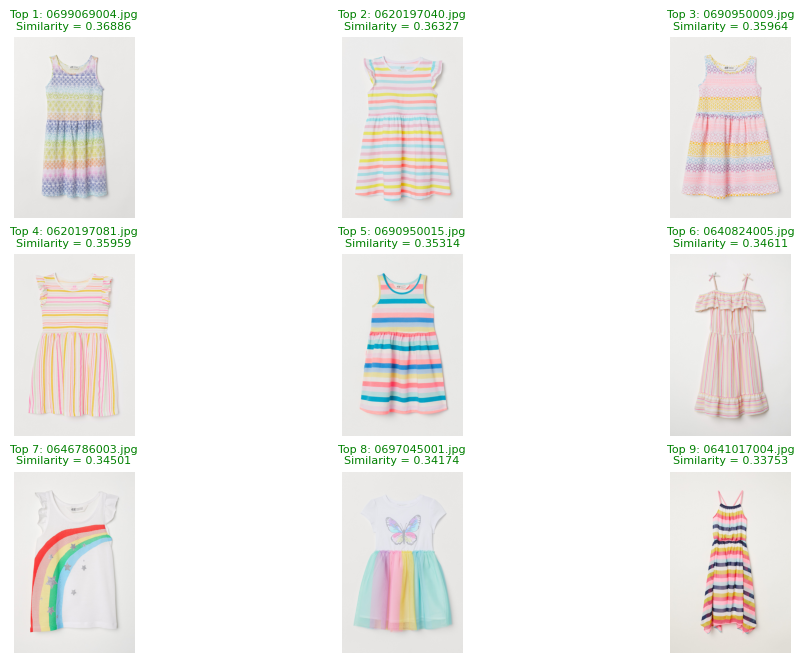

 2023-04-18 15:38:54 Powered by Azure Computer Vision Florence


,image_file,similarity
9739,fashion/0699069004.jpg,0.368856
353,fashion/0620197040.jpg,0.363266
6351,fashion/0690950009.jpg,0.359637
376,fashion/0620197081.jpg,0.359587
6356,fashion/0690950015.jpg,0.353135
...,...,...
2453,fashion/0625722001.jpg,0.063568
6147,fashion/0690343001.jpg,0.063519
5316,fashion/0647207012.jpg,0.063188
7799,fashion/0694751004.jpg,0.063142


In [46]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 5

In [47]:
query = "green shoes"


Similar images using query = green shoes


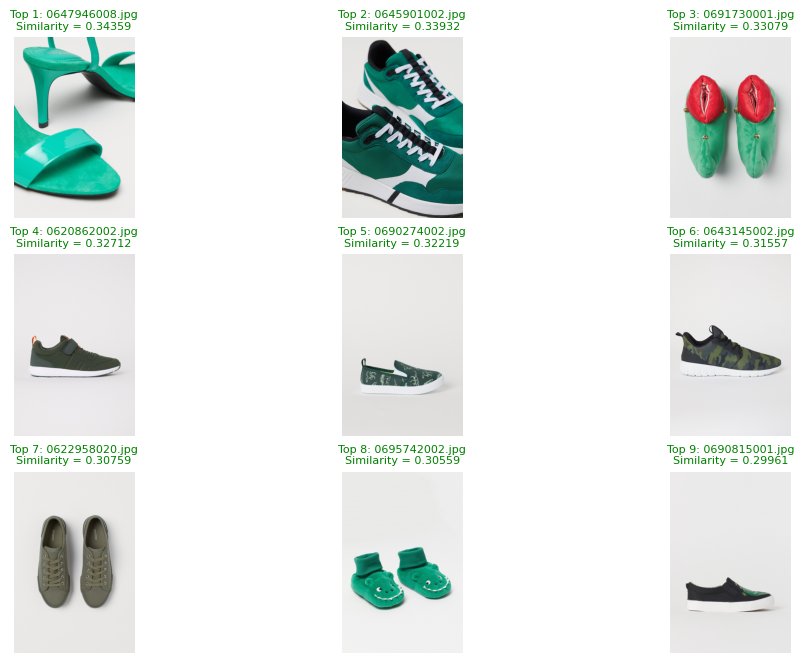

 2023-04-18 15:39:00 Powered by Azure Computer Vision Florence


,image_file,similarity
5477,fashion/0647946008.jpg,0.343586
4979,fashion/0645901002.jpg,0.339324
6634,fashion/0691730001.jpg,0.330791
644,fashion/0620862002.jpg,0.327117
6132,fashion/0690274002.jpg,0.322192
...,...,...
5186,fashion/0646779002.jpg,0.071945
3897,fashion/0640557001.jpg,0.071761
9354,fashion/0698190001.jpg,0.064120
2245,fashion/0625216009.jpg,0.061767


In [48]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 6

In [49]:
query = "ray-ban"


Similar images using query = ray-ban


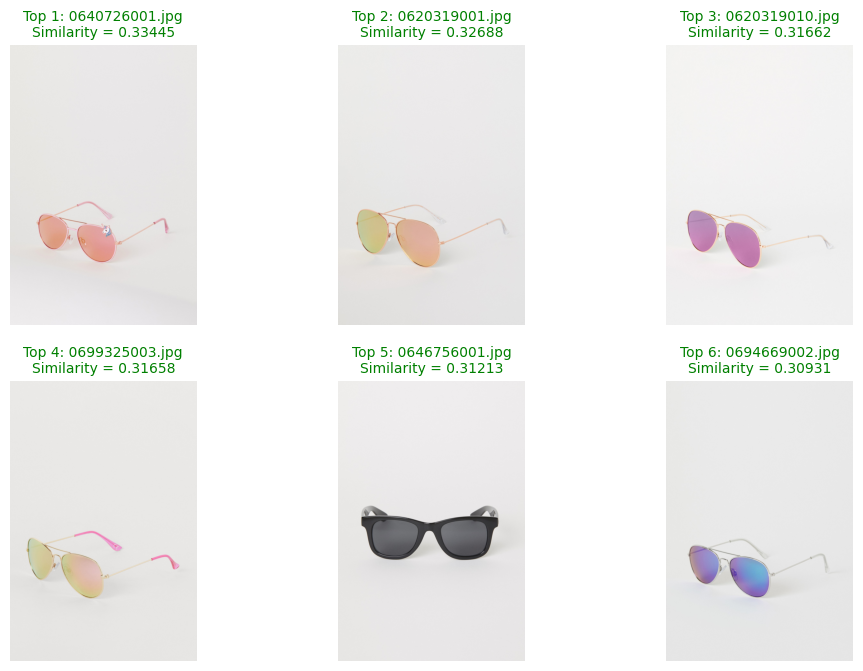

 2023-04-18 15:39:05 Powered by Azure Computer Vision Florence


,image_file,similarity
3965,fashion/0640726001.jpg,0.334446
473,fashion/0620319001.jpg,0.326879
475,fashion/0620319010.jpg,0.316625
9887,fashion/0699325003.jpg,0.316577
5174,fashion/0646756001.jpg,0.312129
...,...,...
5453,fashion/0647794001.jpg,0.126396
9451,fashion/0698387001.jpg,0.125699
1345,fashion/0623252001.jpg,0.124278
9682,fashion/0698913002.jpg,0.124086


In [50]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 7

In [51]:
query = "shirt with LA written on it"


Similar images using query = shirt with LA written on it


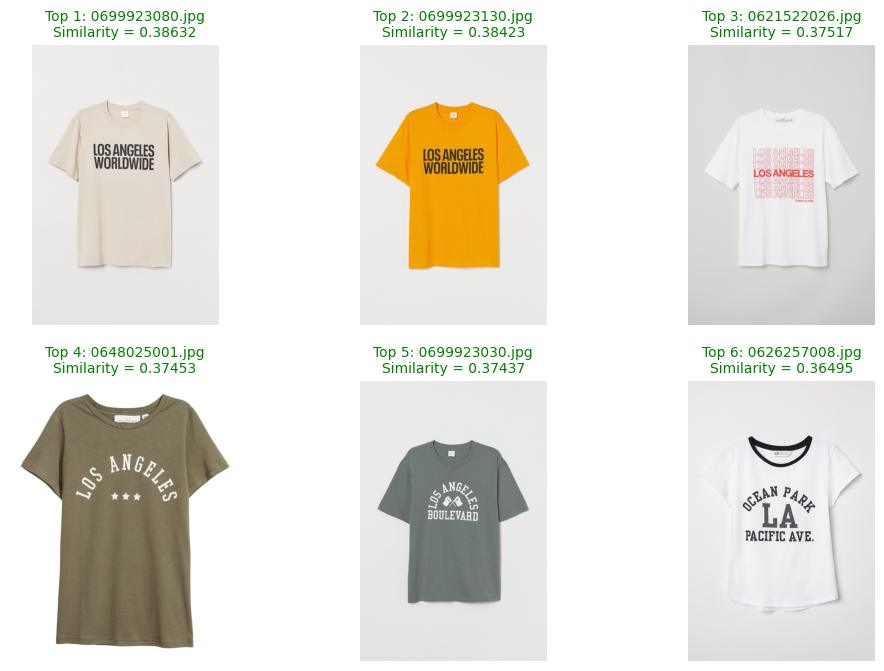

 2023-04-18 15:39:10 Powered by Azure Computer Vision Florence


,image_file,similarity
10167,fashion/0699923080.jpg,0.386316
10188,fashion/0699923130.jpg,0.384234
821,fashion/0621522026.jpg,0.375166
5495,fashion/0648025001.jpg,0.374527
10151,fashion/0699923030.jpg,0.374368
...,...,...
5185,fashion/0646769001.jpg,0.049055
9096,fashion/0697506001.jpg,0.044397
7752,fashion/0694736010.jpg,0.044267
7742,fashion/0694726002.jpg,0.039512


In [52]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 8

In [53]:
query = "bag with fruits on it"


Similar images using query = bag with fruits on it


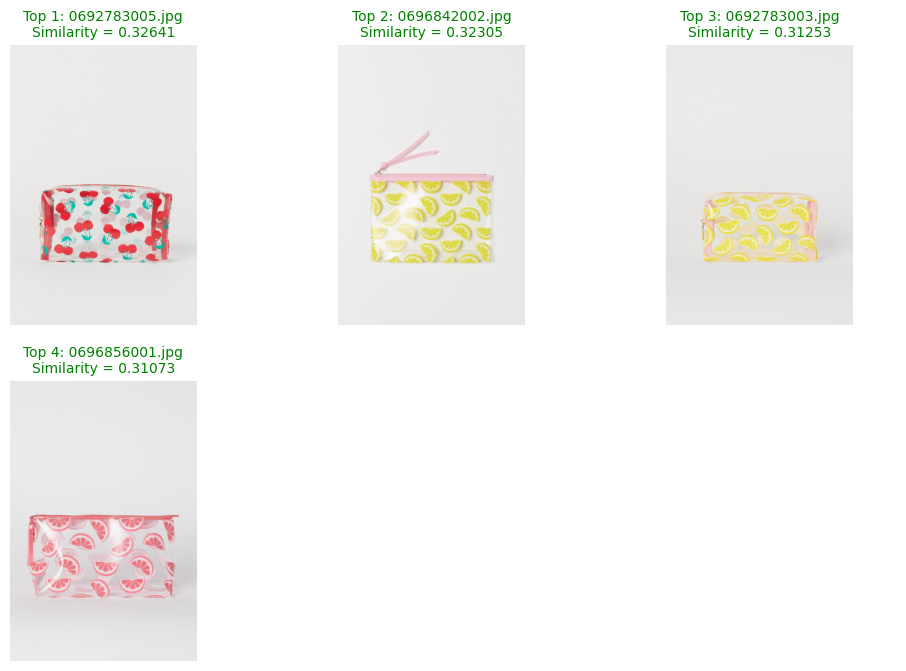

 2023-04-18 15:39:14 Powered by Azure Computer Vision Florence


,image_file,similarity
6870,fashion/0692783005.jpg,0.326410
8702,fashion/0696842002.jpg,0.323046
6868,fashion/0692783003.jpg,0.312532
8707,fashion/0696856001.jpg,0.310726
1142,fashion/0622522001.jpg,0.299213
...,...,...
3738,fashion/0640159003.jpg,0.040470
1622,fashion/0623992001.jpg,0.039041
3452,fashion/0629024001.jpg,0.038750
8683,fashion/0696797001.jpg,0.036948


In [54]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 9

In [55]:
query = "phone shell"

Top 6 images:

001 fashion/0391598046.jpg with similarity index = 0.3491886124646867
002 fashion/0647504002.jpg with similarity index = 0.3436311547325115
003 fashion/0647504001.jpg with similarity index = 0.33974596248930955
004 fashion/0643283001.jpg with similarity index = 0.33944527005434333
005 fashion/0391598061.jpg with similarity index = 0.33865553034661156
006 fashion/0391598062.jpg with similarity index = 0.3311138825049328

Similar images using query = phone shell


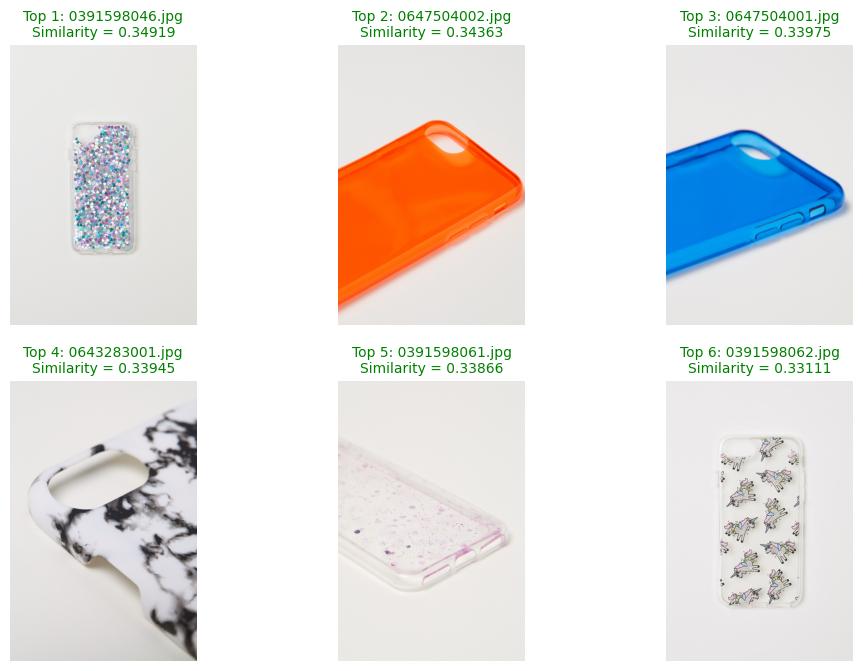

 2023-04-18 15:39:19 Powered by Azure Computer Vision Florence


,image_file,similarity
16,fashion/0391598046.jpg,0.349189
5404,fashion/0647504002.jpg,0.343631
5403,fashion/0647504001.jpg,0.339746
4512,fashion/0643283001.jpg,0.339445
18,fashion/0391598061.jpg,0.338656
...,...,...
569,fashion/0620447002.jpg,0.142436
9255,fashion/0697920059.jpg,0.141646
130,fashion/0395864070.jpg,0.141575
28,fashion/0392168001.jpg,0.141339


In [56]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=True)

### Test 10

In [57]:
query = "bird"


Similar images using query = bird


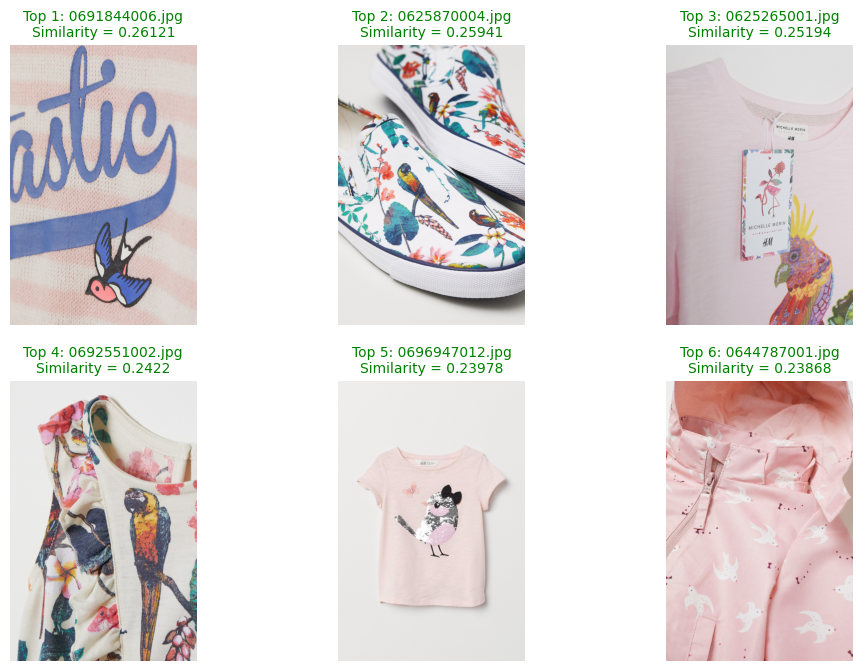

 2023-04-18 15:39:24 Powered by Azure Computer Vision Florence


,image_file,similarity
6683,fashion/0691844006.jpg,0.261207
2498,fashion/0625870004.jpg,0.259414
2266,fashion/0625265001.jpg,0.251945
6832,fashion/0692551002.jpg,0.242196
8776,fashion/0696947012.jpg,0.239775
...,...,...
336,fashion/0620188001.jpg,0.097747
1271,fashion/0622967001.jpg,0.093482
3045,fashion/0627189001.jpg,0.083379
1735,fashion/0624224004.jpg,0.083069


In [58]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 11

In [59]:
query = "Italian cities"


Similar images using query = Italian cities


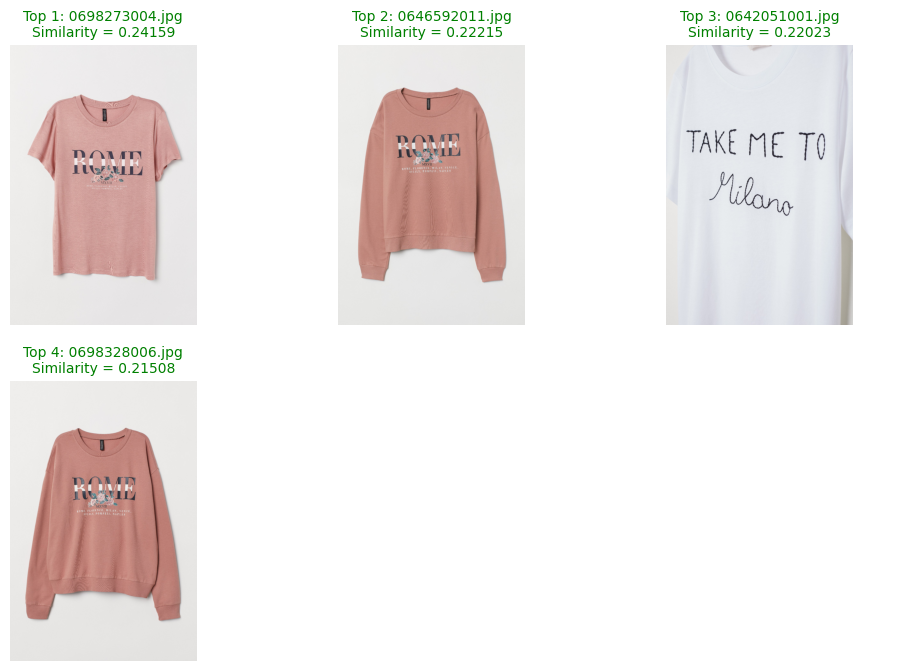

 2023-04-18 15:39:29 Powered by Azure Computer Vision Florence


,image_file,similarity
9381,fashion/0698273004.jpg,0.241590
5135,fashion/0646592011.jpg,0.222154
4241,fashion/0642051001.jpg,0.220226
9439,fashion/0698328006.jpg,0.215080
6628,fashion/0691724009.jpg,0.206684
...,...,...
5587,fashion/0648415002.jpg,0.092257
5827,fashion/0649323001.jpg,0.091309
3867,fashion/0640525004.jpg,0.090046
3873,fashion/0640528002.jpg,0.089811


In [60]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 12

In [61]:
query = "hamburger"


Similar images using query = hamburger


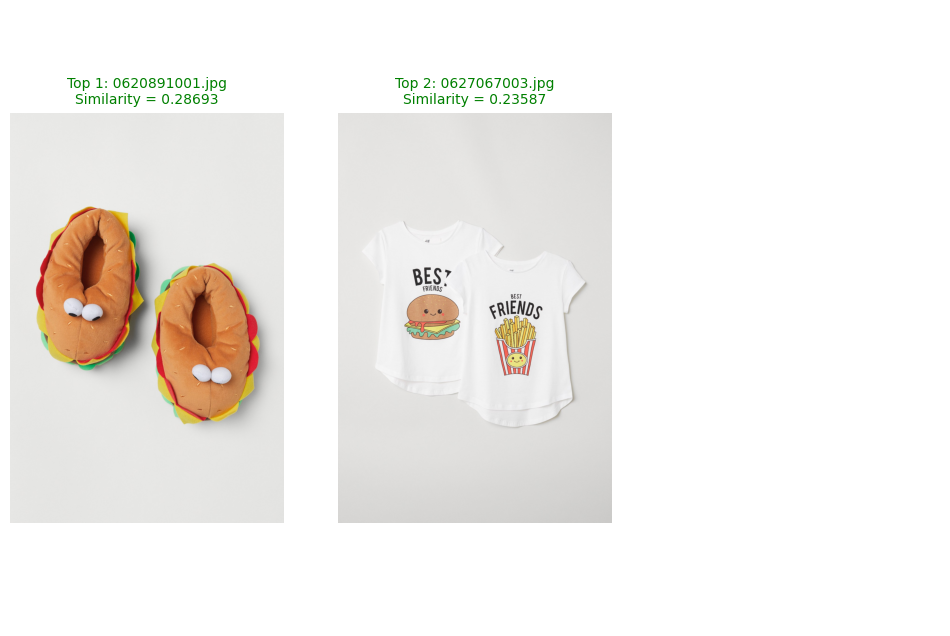

 2023-04-18 15:39:32 Powered by Azure Computer Vision Florence


,image_file,similarity
653,fashion/0620891001.jpg,0.286932
2996,fashion/0627067003.jpg,0.235867
4641,fashion/0643968001.jpg,0.205466
6104,fashion/0690217001.jpg,0.201833
1465,fashion/0623655001.jpg,0.201152
...,...,...
1311,fashion/0623059003.jpg,0.082682
4581,fashion/0643591001.jpg,0.082609
3857,fashion/0640476001.jpg,0.080978
3858,fashion/0640476002.jpg,0.076965


In [62]:
get_results_using_prompt(query, image_files, list_emb, topn=2, disp=False)

### Test 13

In [63]:
query = "skeleton"


Similar images using query = skeleton


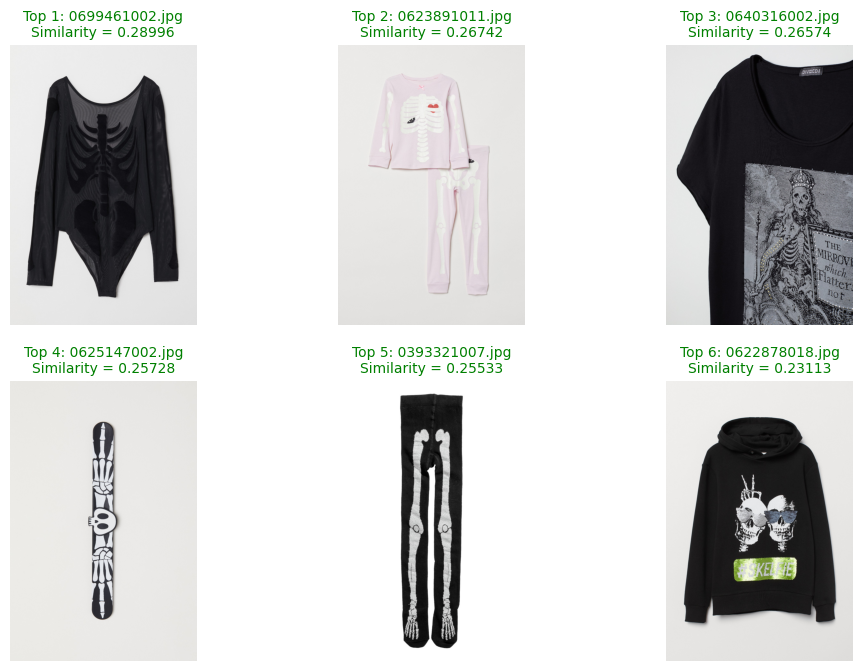

 2023-04-18 15:39:37 Powered by Azure Computer Vision Florence


,image_file,similarity
9952,fashion/0699461002.jpg,0.289958
1573,fashion/0623891011.jpg,0.267419
3812,fashion/0640316002.jpg,0.265735
2196,fashion/0625147002.jpg,0.257281
52,fashion/0393321007.jpg,0.255330
...,...,...
547,fashion/0620425013.jpg,0.090199
604,fashion/0620608001.jpg,0.089380
6801,fashion/0692322002.jpg,0.088854
3621,fashion/0629881004.jpg,0.084867


In [64]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 14

In [65]:
query = "black leather belt"


Similar images using query = black leather belt


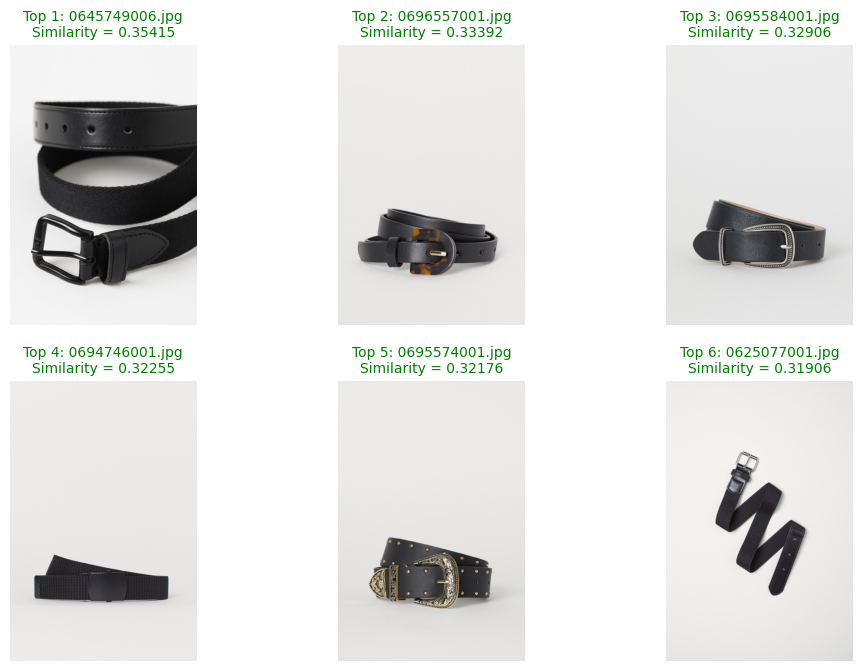

 2023-04-18 15:39:42 Powered by Azure Computer Vision Florence


,image_file,similarity
4953,fashion/0645749006.jpg,0.354150
8595,fashion/0696557001.jpg,0.333919
8187,fashion/0695584001.jpg,0.329064
7792,fashion/0694746001.jpg,0.322548
8173,fashion/0695574001.jpg,0.321759
...,...,...
6238,fashion/0690625008.jpg,0.068925
6237,fashion/0690625007.jpg,0.068838
1533,fashion/0623850005.jpg,0.067549
8361,fashion/0695909007.jpg,0.065211


In [66]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 15

In [67]:
query = "brown leather belt"


Similar images using query = brown leather belt


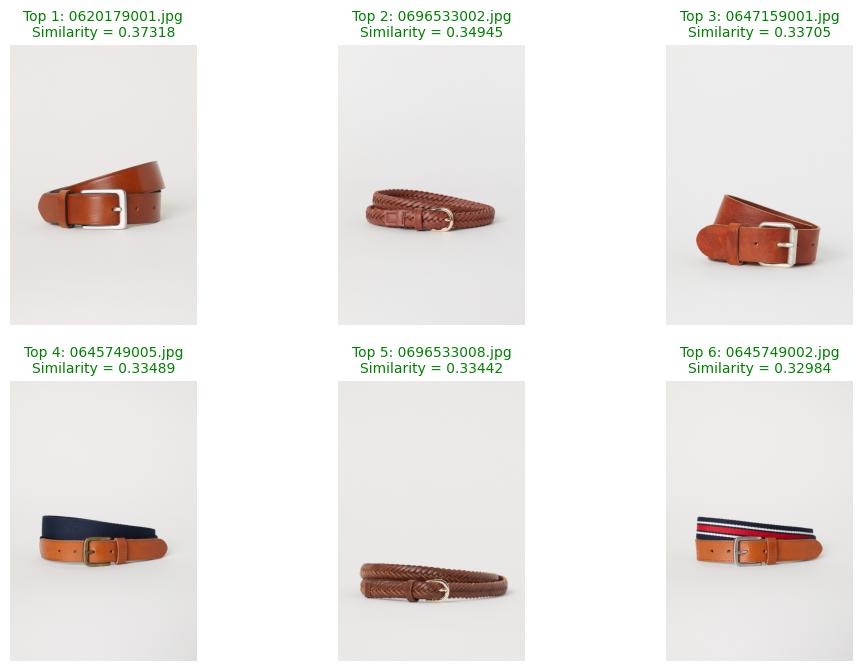

 2023-04-18 15:39:46 Powered by Azure Computer Vision Florence


,image_file,similarity
329,fashion/0620179001.jpg,0.373182
8582,fashion/0696533002.jpg,0.349454
5301,fashion/0647159001.jpg,0.337046
4952,fashion/0645749005.jpg,0.334894
8585,fashion/0696533008.jpg,0.334418
...,...,...
4869,fashion/0645325001.jpg,0.066973
9657,fashion/0698865005.jpg,0.066606
8608,fashion/0696614005.jpg,0.062453
2372,fashion/0625565001.jpg,0.061560


In [68]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 16

In [69]:
query = "butterfly hair pin"


Similar images using query = butterfly hair pin


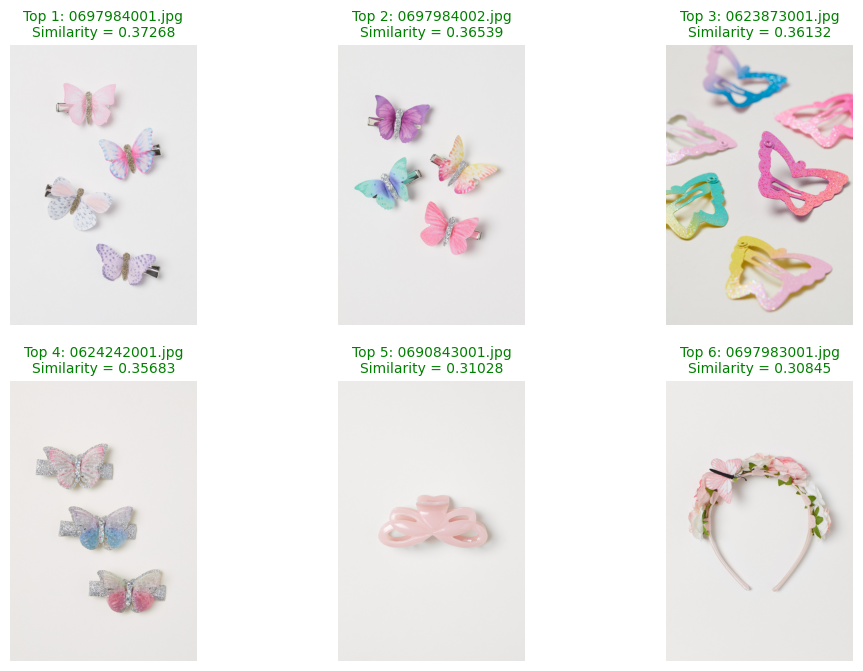

 2023-04-18 15:39:51 Powered by Azure Computer Vision Florence


,image_file,similarity
9277,fashion/0697984001.jpg,0.372678
9278,fashion/0697984002.jpg,0.365386
1558,fashion/0623873001.jpg,0.361316
1737,fashion/0624242001.jpg,0.356829
6292,fashion/0690843001.jpg,0.310283
...,...,...
3309,fashion/0628621003.jpg,0.051438
4869,fashion/0645325001.jpg,0.050955
1415,fashion/0623397001.jpg,0.049606
1434,fashion/0623442005.jpg,0.046820


In [70]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 17

In [71]:
query = "shirt with shark, dolphin, fish or whale"


Similar images using query = shirt with shark, dolphin, fish or whale


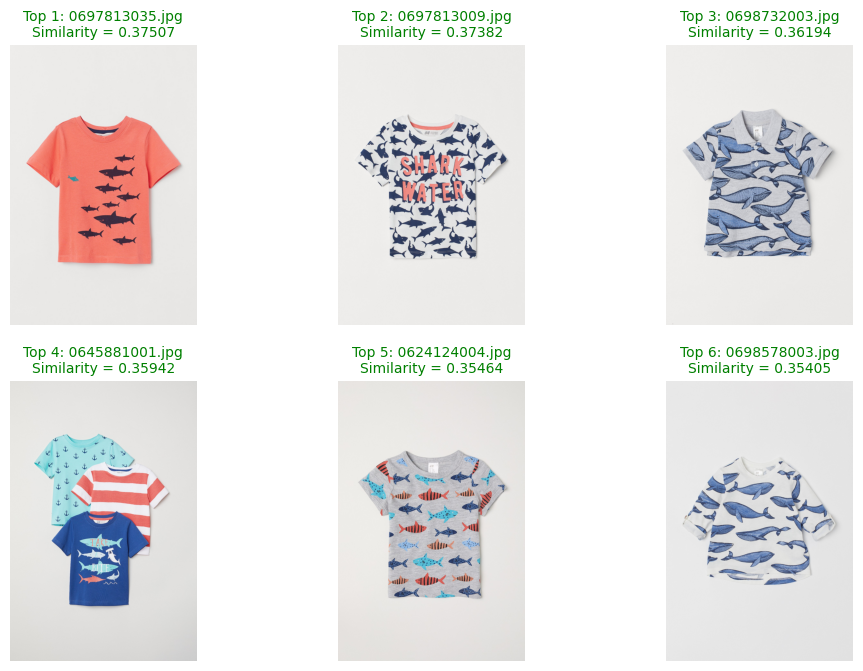

 2023-04-18 15:39:56 Powered by Azure Computer Vision Florence


,image_file,similarity
9204,fashion/0697813035.jpg,0.375074
9193,fashion/0697813009.jpg,0.373821
9590,fashion/0698732003.jpg,0.361937
4967,fashion/0645881001.jpg,0.359419
1712,fashion/0624124004.jpg,0.354638
...,...,...
693,fashion/0621014001.jpg,0.020521
619,fashion/0620746003.jpg,0.018556
9806,fashion/0699176001.jpg,0.015479
7892,fashion/0695001001.jpg,0.012235


In [72]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

> In the next notebook we will do some image clustering using vector embeddings